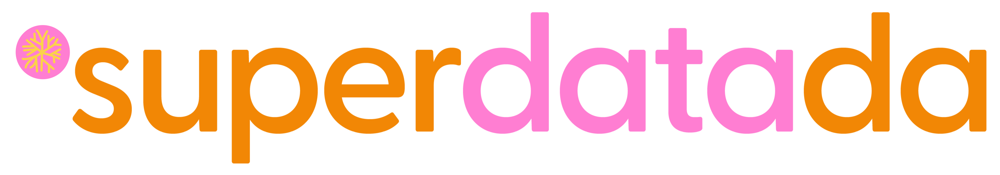

# 🏪🌆 La invasión de los Oxxos y Seven Eleven en CDMX

Se tomaron **muy en serio** eso de *“estar a la vuelta de tu vida”*.  
Literal. **Están en todas partes.** 😅

Pero… 🤔  
¿La sociedad realmente lo pidió?  
¿Están cubriendo una necesidad que **ya existía**?  
¿O más bien estamos aceptando una ciudad diseñada por inercia comercial?

¿Qué pasaría si **planeáramos mejor la ciudad** de acuerdo con **nuestras necesidades reales** y no solo con las del mercado?

> ✨ **¡Menos Andattis, más áreas verdes!** 🌳💚

---

## 🧪 Te cuento del experimento

La idea es simple, pero poderosa:

- 📍 **Ubicamos cada Oxxo y Seven Eleven** usando bases de datos abiertas  
- 🗺️ Visualizamos todo con **Folium**, porque ver el problema ayuda a entenderlo  
- 🚶‍♀️ Según el criterio de **caminabilidad de la ONU**, la distancia ideal es de **400 metros**
- 🚨 **Etiquetamos los casos absurdos**: tiendas demasiado cercanas entre sí  
- 🕸️ Aplicamos **teoría de grafos** para optimizar la red  
  - Solo dejamos aristas **≤ 400 m**
- ❌ Los establecimientos "absurdos" se **eliminan del modelo**
- 🌱 Cada uno se **reemplaza por áreas verdes**:
  - Techos verdes
  - Espacios de contribución ecológica
- 📊 Finalmente, sacamos **estadísticas** para estimar el impacto real del experimento

---

## 💻 Código abierto, ciudad abierta

Ya sabes cómo va esto:

👉 **El código es tuyo**  
👉 **Compártelo**  
👉 **Mejóralo**  
👉 **Enriquécelo**  

La ciudad también se puede *hackear*, pero para bien 😌

**Datos**


- **Coordenadas Oxxo ✅**


Directorio Estadístico Nacional de Unidades Económicas:
https://www.inegi.org.mx/app/mapa/denue/default.aspx

- **Coordenadas 7 Eleven ✅**


Directorio de 7 eleven: https://7-eleven.com.mx/buscador-de-tiendas/fetch_data.php

---

## 🌆 Para cerrar

**Exijamos una ciudad planeada para sus ciudadanos,  
no para sus empresarios.**

Porque caminar, respirar y convivir  
vale más que otro café idéntico en la esquina ☕🚫🌳

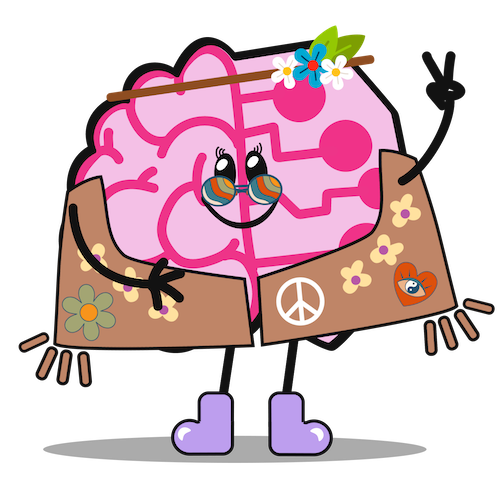

# Librerías

In [35]:
import pandas as pd
import requests
import folium
from folium.plugins import HeatMap
import json
import geopandas as gpd
from sklearn.neighbors import BallTree
import numpy as np
import networkx as nx


pd.set_option("display.max_columns", None)

# Lectura de Datos

## Oxxo

In [4]:
# https://www.inegi.org.mx/app/mapa/denue/default.aspx
ox = pd.read_csv("data/INEGI_DENUE_08102025.csv", encoding="latin1")
ox.head()

,ID,Clee,Nombre de la Unidad Económica,Razón social,Código de la clase de actividad SCIAN,Nombre de clase de la actividad,Descripcion estrato personal ocupado,Tipo de vialidad,Nombre de la vialidad,Tipo de entre vialidad 1,Nombre de entre vialidad 1,Tipo de entre vialidad 2,Nombre de entre vialidad 2,Tipo de entre vialidad 3,Nombre de entre vialidad 3,Número exterior o kilómetro,Letra exterior,Edificio,Edificio Piso,Número interior,Letra interior,Tipo de asentamiento humano,Nombre de asentamiento humano,Tipo centro comercial,"Corredor industrial, centro comercial o mercado público",Número de local,Código Postal,Clave entidad,Entidad federativa,Clave municipio,Municipio,Clave localidad,Localidad,Área geoestadística básica,Manzana,Número de teléfono,Correo electrónico,Sitio en Internet,Tipo de establecimiento,Latitud,Longitud,Fecha de incorporación al DENUE
0,6230765,01001468411000193000008448S4,OXXO GAS SUC 55147 NACOZARI AGU,SERVICIOS GASOLINEROS DE MEXICO SA DE CV,468411,Comercio al por menor de gasolina y diesel,6 a 10 personas,AVENIDA,CONVENCIÓN DE 1914 NORTE,CALLE,20 DE NOVIEMBRE,AVENIDA,HÉROE DE NACOZARI NORTE,CALLE,CELSO BERNAL,406.0,NaN,NaN,NaN,NaN,NaN,COLONIA,MORELOS,NaN,NaN,NaN,20140.0,1,AGUASCALIENTES,1,Aguascalientes,1,Aguascalientes,198A,27,NaN,ATENCIONCLIENTES@OXXOGAS.COM,WWW.OXXOGAS.COM,Fijo,21.901790,-102.288813,2010-07
1,6791601,01001468411001033000008448S1,OXXO GAS SUC 55AMA GANDHI AGU,SERVICIOS GASOLINEROS DE MEXICO SA DE CV,468411,Comercio al por menor de gasolina y diesel,6 a 10 personas,AVENIDA,MAHATMA GANDHI,CALLE,REPÚBLICA DE PANAMÁ,AVENIDA,CONVENCIÓN DE 1914 SUR,CALLE,REPÚBLICA DE ARGENTINA,719.0,NaN,NaN,NaN,NaN,NaN,FRACCIONAMIENTO,TORRES DE SAN FRANCISCO,NaN,NaN,NaN,20280.0,1,AGUASCALIENTES,1,Aguascalientes,1,Aguascalientes,0869,4,NaN,ATENCIONCLIENTES@OXXOGAS.COM,WWW.OXXOGAS.COM,Fijo,21.866081,-102.295673,2017-03
2,6230806,01001468411000603000008448S2,OXXO GAS SUC 55DHI BOSQUES DEL PRADOAGU,SERVICIOS GASOLINEROS DE MEXICO SA DE CV,468411,Comercio al por menor de gasolina y diesel,6 a 10 personas,AVENIDA,AGUASCALIENTES NORTE,AVENIDA,MOSCATEL,CALLE,NINGUNO,CALLE,NINGUNO,999.0,NaN,NaN,NaN,NaN,NaN,COLONIA,BOSQUES DEL PRADO ORIENTE,NaN,NaN,NaN,20157.0,1,AGUASCALIENTES,1,Aguascalientes,1,Aguascalientes,1693,44,NaN,ATENCIONCLIENTES@OXXOGAS.COM,WWW.OXXOGAS.COM,Fijo,21.914798,-102.281840,2014-12
3,6230754,01001468411000573000008448S7,OXXO GAS SUC 55ERU GIACINTI AGU,SERVICIOS GASOLINEROS DE MEXICO SA DE CV,468411,Comercio al por menor de gasolina y diesel,6 a 10 personas,BOULEVARD,BOULEVARD A ZACATECAS,CALLE,AGLAYA,CALLE,FAJA DE ORO,CALLE,MINATITLÁN,304.0,NaN,NaN,NaN,NaN,NaN,FRACCIONAMIENTO,EL PLATEADO,NaN,NaN,NaN,20137.0,1,AGUASCALIENTES,1,Aguascalientes,1,Aguascalientes,198A,13,NaN,ATENCIONCLIENTES@OXXOGAS.COM,WWW.OXXOGAS.COM,Fijo,21.905985,-102.292558,2014-12
4,43123,01005468411000122000008448S4,OXXO GAS SUC 55FZX PASEO DE LAS MARAVILLAS BJY,SERVICIOS GASOLINEROS DE MEXICO SA DE CV,468411,Comercio al por menor de gasolina y diesel,6 a 10 personas,AVENIDA,SIGLO XXI,AVENIDA,PASEO DE LAS MARAVILLAS,PRIVADA,SANTA CRUZ,CALLE,JOSÉ LÓPEZ PORTILLO,1770.0,NaN,NaN,NaN,NaN,NaN,FRACCIONAMIENTO,VILLA CAMPESTRE,NaN,NaN,NaN,20900.0,1,AGUASCALIENTES,5,Jesús María,245,El Llano,0603,13,NaN,ATENCIONCLIENTES@OXXOGAS.COM,WWW.OXXOGAS.COM,Fijo,21.949961,-102.321055,2014-12


Quitar Oxxo GAS

In [5]:
ox = ox[~ox['Nombre de clase de la actividad'].str.contains('gasolina')]

## 7 eleven

In [6]:
# URL del endpoint
url = "https://7-eleven.com.mx/buscador-de-tiendas/fetch_data.php"

# Hacer la petición al endpoint
response = requests.get(url)
data = response.json()  # Convertir a JSON

# Extraer los datos de la clave 'values'
raw_values = data.get("values", [])

# Convertir a DataFrame
sv = pd.DataFrame(raw_values[1:], columns=raw_values[0])  # Saltar encabezado en los datos
sv.head()

,id_tienda,nombre_tienda,direccion_tienda,ciudad_tienda,estado_tienda,cp_tienda,lat_tienda,long_tienda,Desayunos y Alimentos,7-drive,Café Frío,Gasolinera,Pizza,7-Lifestyle,Importados,Servicios Financieros,Amazon Locker
0,0001,TECNOLOGICO,Colonia: Tecnologico. Av. Del Estado # 2600,Monterrey,Nuevo León,64700,25.650979,-100.292514,1,,1,,1,1,1,1,1
1,0004,GOMEZ MORIN,Colonia: Sta Engracia. Av. Gomez Morin # 402,San Pedro Garza García,Nuevo León,66267,25.656020,-100.356662,1,,1,,1,1,1,1,1
2,0005,SANTA BARBARA,Colonia: Rec San Francisco. Av. Sta. Barbara #...,San Pedro Garza García,Nuevo León,66230,25.659557,-100.393368,1,,1,,1,,1,1,1
3,0175,PRESIDENCIA,Colonia: San Pedro Centro. Av. Vasconcelos # 100,San Pedro Garza García,Nuevo León,66230,25.662334,-100.403370,1,,1,,1,,,1,None
4,0006,ANAHUAC,Colonia: Anahuac. Av. Topo Chico # 810,San Nicolás De Los Garza,Nuevo León,66450,25.736729,-100.313769,1,,1,,1,,1,1,None


In [7]:
# Correccion de entidades
# Solo para las filas con 'Ciudad de México' en ciudad_tienda
mask = sv['ciudad_tienda'] == 'Ciudad de México'

# Extraer el valor después de la última coma en 'direccion_tienda' y hacer strip para eliminar espacios
sv.loc[mask, 'ciudad_tienda'] = sv.loc[mask, 'direccion_tienda'].str.split(',').str[-1].str.strip()

## Unión de Bases (Oxxo y Seven Eleven)

In [14]:
# Filtramos y renombramos columnas para unificar nombres
oxcdmx = ox[ox['Clave entidad'] == 9][['Latitud', 'Longitud','Municipio']] #cdmx
oxcdmx = oxcdmx.rename(columns={'Latitud': 'latitud', 'Longitud': 'longitud','Municipio':'alcaldia'})
oxcdmx['tienda'] = 'oxxo'

svcdmx = sv[sv['estado_tienda'] == 'Ciudad de México'][['lat_tienda', 'long_tienda','ciudad_tienda']]
svcdmx = svcdmx.rename(columns={'lat_tienda': 'latitud', 'long_tienda': 'longitud','ciudad_tienda':'alcaldia'})
svcdmx['tienda'] = 'seven'

# Unimos los dos DataFrames
df_cdmx = pd.concat([oxcdmx, svcdmx], ignore_index=True)

# Resultado
df_cdmx.head()


,latitud,longitud,alcaldia,tienda
0,19.350547,-99.038475,Iztapalapa,oxxo
1,19.339439,-99.06452,Iztapalapa,oxxo
2,19.341623,-99.074847,Iztapalapa,oxxo
3,19.463691,-99.112497,Gustavo A. Madero,oxxo
4,19.501277,-99.195816,Azcapotzalco,oxxo


# Invasión en CDMX

In [ ]:
# Crear un mapa centrado en la Ciudad de México
cdmx_center = [19.4326, -99.1332]
mapa = folium.Map(location=cdmx_center, zoom_start=11)

# Agregar puntos para OXXO (rojo)
for _, row in df_cdmx[df_cdmx["tienda"] == "oxxo"].iterrows():
    folium.CircleMarker(
        location=[row["latitud"], row["longitud"]],
        radius=3,
        color="red",
        fill=True,
        fill_color="red",
        fill_opacity=0.7,
    ).add_to(mapa)

# Agregar puntos para Seven
for _, row in df_cdmx[df_cdmx["tienda"] == "seven"].iterrows():
    folium.CircleMarker(
        location=[row["latitud"], row["longitud"]],
        radius=3,
        color="red",
        fill=True,
        fill_color="red",
        fill_opacity=0.7,
    ).add_to(mapa)

from IPython.display import display

display(mapa)


## Total

In [15]:
df_cdmx.shape

(1730, 4)

In [30]:
m = folium.Map(location=[19.35, -99.05], zoom_start=13)
HeatMap(df_cdmx[["latitud", "longitud"]], radius=15).add_to(m)
m

# Resultados por Alcaldía

**Requisito**


👉 Descargar el archivo de los límites de las alcaldías de CDMX en: https://datos.cdmx.gob.mx/dataset/alcaldias

In [16]:
df_cdmx.groupby('alcaldia').count()

,latitud,longitud,tienda
alcaldia,,,
Azcapotzalco,77,77,77
Benito Juárez,244,244,244
Coyoacán,137,137,137
Cuajimalpa de Morelos,39,39,39
Cuauhtémoc,302,302,302
Gustavo A. Madero,120,120,120
Iztacalco,58,58,58
Iztapalapa,167,167,167
La Magdalena Contreras,24,24,24


In [40]:
# =========================
# Utilidades Geo
# =========================


def load_geojson(path: str) -> dict:
    """Carga un archivo GeoJSON desde disco."""
    with open(path, "r", encoding="utf-8") as file:
        return json.load(file)


def filter_alcaldia(data: dict, name: str) -> dict:
    """Filtra un FeatureCollection por nombre de alcaldía."""
    features = [
        feature
        for feature in data["features"]
        if feature["properties"].get("NOMGEO") == name
    ]

    return {
        "type": "FeatureCollection",
        "crs": data.get("crs"),
        "features": features,
    }


def featurecollection_to_polygon(fc: dict) -> gpd.GeoSeries:
    """Convierte un FeatureCollection en un polígono unificado."""
    gdf = gpd.GeoDataFrame.from_features(
        fc["features"],
        crs="EPSG:4326",
    )
    return gdf.geometry.unary_union


def tiendas_fuera_de_poligono(
    df,
    polygon,
) -> gpd.GeoDataFrame:
    """Devuelve tiendas fuera de un polígono dado."""
    return df[~df.within(polygon)]


# =========================
# Pipeline principal
# =========================

# Cargar límites de alcaldías
alcaldias = load_geojson("limite-de-las-alcaldas.json")

# Crear GeoDataFrame de tiendas
gdf_tiendas = gpd.GeoDataFrame(
    df_cdmx,
    geometry=gpd.points_from_xy(
        df_cdmx["longitud"],
        df_cdmx["latitud"],
    ),
    crs="EPSG:4326",
)

# Polígonos de alcaldías de interés
poligono_bj = featurecollection_to_polygon(filter_alcaldia(alcaldias, "Benito Juárez"))

poligono_mp = featurecollection_to_polygon(filter_alcaldia(alcaldias, "Milpa Alta"))

# Filtrar tiendas fuera de cada alcaldía
gdf_fuera_bj = tiendas_fuera_de_poligono(
    gdf_tiendas,
    poligono_bj,
)

gdf_fuera_mp = tiendas_fuera_de_poligono(
    gdf_tiendas,
    poligono_mp,
)


/var/folders/v7/cl4hbmdd3ll2lthltrhxjyjh0000gn/T/ipykernel_55974/1450489958.py:33: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  return gdf.geometry.unary_union
/var/folders/v7/cl4hbmdd3ll2lthltrhxjyjh0000gn/T/ipykernel_55974/1450489958.py:33: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  return gdf.geometry.unary_union


## Mapa con Alcaldías

In [42]:
# Centro del mapa
cdmx_center = [19.4059, -99.1620]
mapa = folium.Map(location=cdmx_center, zoom_start=12)

# Agregar el polígono de Benito Juárez
folium.GeoJson(
    bj,
    name="Benito Juárez",
    style_function=lambda x: {
        "fillColor": "#7009D7",  # amarillo
        "color": "#7009D7",
        "weight": 2,
        "fillOpacity": 0.25,
    },
    highlight_function=lambda x: {
        "fillColor": "#7009D7",
        "fillOpacity": 0.5,
        "weight": 3,
    },
    #tooltip=folium.GeoJsonTooltip(fields=["NOMGEO"]),
).add_to(mapa)
# Agregar el polígono de Benito Juárez
folium.GeoJson(
    mp,
    name="Milpa Alta",
    style_function=lambda x: {
        "fillColor": "#D70973",  # amarillo
        "color": "#D70973",
        "weight": 2,
        "fillOpacity": 0.25,
    },
    highlight_function=lambda x: {
        "fillColor": "#D70973",
        "fillOpacity": 0.5,
        "weight": 3,
    },
    tooltip=folium.GeoJsonTooltip(fields=["NOMGEO"]),
).add_to(mapa)
# Agregar puntos para OXXO (rojo)
for _, row in gdf_fuera_mp[gdf_fuera_mp["tienda"] == "oxxo"].iterrows():
    folium.CircleMarker(
        location=[row["latitud"], row["longitud"]],
        radius=3,
        color="red",
        fill=True,
        fill_color="red",
        fill_opacity=0.7,
    ).add_to(mapa)

# Agregar puntos para Seven 
for _, row in gdf_fuera_mp[gdf_fuera_mp["tienda"] == "seven"].iterrows():
    folium.CircleMarker(
        location=[row["latitud"], row["longitud"]],
        radius=3,
        color="red",
        fill=True,
        fill_color="red",
        fill_opacity=0.7,
    ).add_to(mapa)
# Mostrar el mapa
display(mapa)

# Identificación de Absurdos

In [25]:
# Forzar conversión a float (esto corrige strings numéricos también)
df_cdmx["latitud"] = pd.to_numeric(df_cdmx["latitud"], errors="coerce")
df_cdmx["longitud"] = pd.to_numeric(df_cdmx["longitud"], errors="coerce")


def haversine(lat1, lon1, lat2, lon2):
    """
    Calcula la distancia en metros entre dos puntos geográficos usando Haversine
    """
    from math import radians, cos, sin, asin, sqrt
    R = 6371000  # Radio de la Tierra en metros
    lat1, lon1, lat2, lon2 = map(radians, [lat1, lon1, lat2, lon2])
    dlat = lat2 - lat1
    dlon = lon2 - lon1
    a = sin(dlat/2)**2 + cos(lat1) * cos(lat2) * sin(dlon/2)**2
    c = 2 * asin(sqrt(a))
    return R * c


def tiendas_cercanas(df, distancia_max_m=100):
    """
    Devuelve DataFrame con pares de tiendas a menos de `distancia_max_m` metros usando BallTree (rápido).
    Incluye coordenadas de ambas tiendas para graficar.
    """
    df = df.reset_index(drop=True)
    coords_rad = np.radians(df[['latitud', 'longitud']])
    tree = BallTree(coords_rad, metric='haversine')
    radio = distancia_max_m / 6371000  # Convertir metros a radianes

    indices = tree.query_radius(coords_rad, r=radio)

    resultados = []

    for i, vecinos in enumerate(indices):
        for j in vecinos:
            if i < j:  # evitar duplicados e identidad
                dist_m = haversine(
                    df.loc[i, 'latitud'], df.loc[i, 'longitud'],
                    df.loc[j, 'latitud'], df.loc[j, 'longitud']
                )
                resultados.append({
                    'id_tienda_1': i,
                    'id_tienda_2': j,
                    'tipo_1': df.loc[i, 'tienda'],
                    'tipo_2': df.loc[j, 'tienda'],
                    'lat_1': df.loc[i, 'latitud'],
                    'lon_1': df.loc[i, 'longitud'],
                    'lat_2': df.loc[j, 'latitud'],
                    'lon_2': df.loc[j, 'longitud'],
                    'distancia_m': round(dist_m, 2)
                })

    return pd.DataFrame(resultados)

In [26]:
df_abs = tiendas_cercanas(df_cdmx, distancia_max_m=400) #caminabilidad

Total tiendas absurdas

In [27]:
len(set(set(df_abs.id_tienda_1).union(set(df_abs.id_tienda_2))))

1376

## Red de Tiendas Absurdas

In [ ]:
m = folium.Map(location=[19.35, -99.05], zoom_start=13)
for _, row in df_abs[df_abs["distancia_m"] < 400].iterrows():
    folium.PolyLine(
        [(row["lat_1"], row["lon_1"]), (row["lat_2"], row["lon_2"])],
        color="#720bc5",
        weight=2,
        opacity=0.5,
    ).add_to(m)
m

In [33]:
#  1️⃣ Obtener el listado de tiendas que tienen vecinas cercanas
tiendas_cercanas = pd.unique(pd.concat([df_abs["id_tienda_1"], df_abs["id_tienda_2"]]))

#  2️⃣ Crear df_tiendas a partir del df_original (usando el index como id)
df_tiendas = df_cdmx.copy()
df_tiendas["id_tienda"] = df_tiendas.index
df_tiendas["tiene_vecina"] = df_tiendas["id_tienda"].isin(tiendas_cercanas)

# 3️⃣ Calcular resumen
total_tiendas = len(df_tiendas)
con_vecina = df_tiendas["tiene_vecina"].sum()
porcentaje = con_vecina / total_tiendas * 100

print(
    f"{con_vecina} de {total_tiendas} tiendas ({porcentaje:.1f}%) tienen otra tienda a ≤400 m."
)

1376 de 1730 tiendas (79.5%) tienen otra tienda a ≤400 m.


In [32]:
df_tiendas.head()

,latitud,longitud,alcaldia,tienda,id_tienda,tiene_vecina
0,19.350547,-99.038475,Iztapalapa,oxxo,0,True
1,19.339439,-99.064520,Iztapalapa,oxxo,1,True
2,19.341623,-99.074847,Iztapalapa,oxxo,2,True
3,19.463691,-99.112497,Gustavo A. Madero,oxxo,3,True
4,19.501277,-99.195816,Azcapotzalco,oxxo,4,False


Tienda con más tiendas cercanas

In [ ]:
cdmx_center = [19.4326, -99.1332]
mapa = folium.Map(location=cdmx_center, zoom_start=11)

color_rojo = '#e74c3c'
color_azul = '#3498db'
color_morado = '#800080'

# Para evitar agregar puntos duplicados
tiendas_agregadas = set()

for _, row in df_abs[df_abs.id_tienda_1==58].iterrows():
    # Agregar tiendas 1 y 2 si no están ya agregadas
    for tienda_id, lat_col, lon_col, tipo_col in [
        ('id_tienda_1', 'lat_1', 'lon_1', 'tipo_1'),
        ('id_tienda_2', 'lat_2', 'lon_2', 'tipo_2')
    ]:
        tid = row[tienda_id]
        if tid not in tiendas_agregadas:
            color = color_rojo if row[tipo_col] == 'oxxo' else color_azul
            folium.CircleMarker(
                location=[row[lat_col], row[lon_col]],
                radius=5,
                color=color,
                fill=True,
                fill_color=color,
                fill_opacity=0.7
            ).add_to(mapa)
            tiendas_agregadas.add(tid)

    # Agregar línea morada conectando las tiendas cercanas
    folium.PolyLine(
        locations=[[row['lat_1'], row['lon_1']], [row['lat_2'], row['lon_2']]],
        color=color_morado,
        weight=2,
        opacity=0.7
    ).add_to(mapa)

mapa

## Mapa de Absurdos

In [ ]:
cdmx_center = [19.4326, -99.1332]
mapa = folium.Map(location=cdmx_center, zoom_start=11)

color_rojo = '#e74c3c'
color_azul = '#3498db'
color_morado = '#800080'

# Para evitar agregar puntos duplicados
tiendas_agregadas = set()

for _, row in abs.iterrows():
    # Agregar tiendas 1 y 2 si no están ya agregadas
    for tienda_id, lat_col, lon_col, tipo_col in [
        ('id_tienda_1', 'lat_1', 'lon_1', 'tipo_1'),
        ('id_tienda_2', 'lat_2', 'lon_2', 'tipo_2')
    ]:
        tid = row[tienda_id]
        if tid not in tiendas_agregadas:
            color = color_rojo if row[tipo_col] == 'oxxo' else color_azul
            folium.CircleMarker(
                location=[row[lat_col], row[lon_col]],
                radius=5,
                color=color,
                fill=True,
                fill_color=color,
                fill_opacity=0.7
            ).add_to(mapa)
            tiendas_agregadas.add(tid)

    # Agregar línea morada conectando las tiendas cercanas
    folium.PolyLine(
        locations=[[row['lat_1'], row['lon_1']], [row['lat_2'], row['lon_2']]],
        color=color_morado,
        weight=2,
        opacity=0.7
    ).add_to(mapa)

mapa

# Eliminación de absurdos (Teoría de Grafos)

In [38]:
# Crear el grafo con las tiendas conectadas si están a <400m
G = nx.Graph()
for _, row in df_abs.iterrows():
    G.add_edge(row['id_tienda_1'], row['id_tienda_2'], weight=row['distancia_m'])

# === Encontrar tiendas a eliminar ===
# Vertex cover aproximado (cubre todas las conexiones eliminando el mínimo de nodos)
tiendas_a_eliminar = nx.algorithms.approximation.min_weighted_vertex_cover(G)

print("Número de tiendas a eliminar:", len(tiendas_a_eliminar))

# === Tiendas que se quedan ===
tiendas_a_mantener = set(df_cdmx.index) - tiendas_a_eliminar
print("Número de tiendas que se mantienen:", len(tiendas_a_mantener))

# ✅ Convertir a lista antes de indexar
df_filtrado = df_cdmx.loc[list(tiendas_a_mantener)].reset_index(drop=True)

Número de tiendas a eliminar: 1002
Número de tiendas que se mantienen: 728


In [54]:
import folium
from folium.plugins import DualMap

# Crear un DualMap (dos mapas sincronizados)
dual_map = DualMap(location=[df_cdmx["latitud"].mean(), df_cdmx["longitud"].mean()], zoom_start=11)

# Mapa 1: todas las tiendas (antes)
for _, row in df_cdmx.iterrows():
    folium.CircleMarker(
        location=[row["latitud"], row["longitud"]],
        radius=4,
        color="red",
        fill=True,
        fill_opacity=0.7,
        popup=f"{row['tienda']} - {row['alcaldia']}"
    ).add_to(dual_map.m1)

# Mapa 2: tiendas filtradas (después)
for _, row in df_filtrado.iterrows():
    folium.CircleMarker(
        location=[row["latitud"], row["longitud"]],
        radius=4,
        color="green",
        fill=True,
        fill_opacity=0.7,
        popup=f"{row['tienda']} - {row['alcaldia']}"
    ).add_to(dual_map.m2)

# Guardar o mostrar
dual_map.save("mapa_antes_despues.html")
dual_map
